---
# Bulk processing Sentinel products to PNG images

---
Sent2 DB:
https://www.indexdatabase.de/db/s-single.php?id=96

SentPlayground:
https://apps.sentinel-hub.com/sentinel-playground/

List:
https://forum.step.esa.int/t/list-of-band-combinations-for-sentinel-2/1156/6


In [1]:
import geopandas as gpd
import folium
import os
from PIL import Image
from sentinelsat.sentinel import SentinelAPI, read_geojson, geojson_to_wkt
import matplotlib.pyplot as plt
import numpy as np
import os
#from geojson import Point
from geojson import Polygon
import geojson
import tempfile
import datetime as dt
from shapely.geometry import MultiPolygon, Polygon
import rasterio as rio
from rasterio import plot
import rasterio.mask
import fiona
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
from skimage import exposure
from pathlib import Path

In [2]:
# Load polygon vector
boundsdata = r'../data/mizieb.geojson'
region = gpd.read_file(boundsdata)
region

nReserve_proj = region.to_crs({'init': 'epsg:32633'})

p = ('../data/selecteddata/Mizieb')

C:\Users\MCAST\anaconda3\envs\remsen\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


---
# RGB (2,3,4)
---

 Mizieb
--- Mizieb (27-06-2019)
------ AUX_DATA
------ DATASTRIP
--------- DS_SGS__20190627T133421_S20190627T095541
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A020954_20190627T095541
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20190627T095031_B01.jp2
--------------- T33SVV_20190627T095031_B02.jp2
--------------- T33SVV_20190627T095031_B03.jp2
--------------- T33SVV_20190627T095031_B04.jp2
--------------- T33SVV_20190627T095031_B05.jp2
--------------- T33SVV_20190627T095031_B06.jp2
--------------- T33SVV_20190627T095031_B07.jp2
--------------- T33SVV_20190627T095031_B08.jp2
--------------- T33SVV_20190627T095031_B09.jp2
--------------- T33SVV_20190627T095031_B10.jp2
--------------- T33SVV_20190627T095031_B11.jp2
--------------- T33SVV_20190627T095031_B12.jp2
--------------- T33SVV_20190627T095031_B8A.jp2
--------------- T33SVV_20190627T095031_TCI.jp2
1
10980
10980
uint16
EPSG:32633
| 10.00, 0.00, 399960.00|
| 0.00,-10.00, 4000020.00|
| 0.00, 0.00, 1.

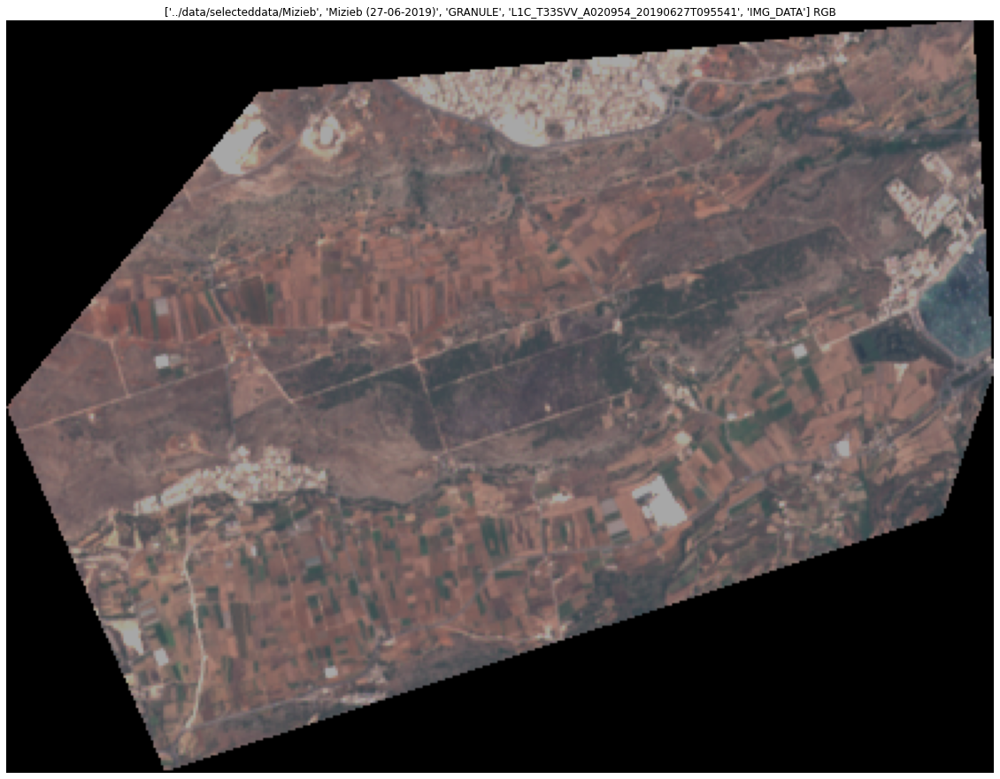

------------ QI_DATA
------ HTML
------ rep_info


In [3]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B02' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #blue
            #if 'B02_20m' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #blue

            if 'B03' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #green
            #if 'B03_20m' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #green

            if 'B04' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #red
            #if 'B04_20m' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #red

            #if 'B08' in file: band8 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #nir

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band4.width, height=band4.height,
                                     count=3,
                                     crs=band4.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            #title = path[]
            ax.set_title(str(path) +' RGB')
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# SWIR (4, 8A, 12)(B12, B8A, B4)
---

 1 per annum
--- MSIL1C_20150715T094306_N0204_R036_T33SVV_20150715T094315.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160812T015357_S20150715T094315
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A000319_20150715T094315
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20150715T094306_B01.jp2
--------------- T33SVV_20150715T094306_B02.jp2
--------------- T33SVV_20150715T094306_B03.jp2
--------------- T33SVV_20150715T094306_B04.jp2
--------------- T33SVV_20150715T094306_B05.jp2
--------------- T33SVV_20150715T094306_B06.jp2
--------------- T33SVV_20150715T094306_B07.jp2
--------------- T33SVV_20150715T094306_B08.jp2
--------------- T33SVV_20150715T094306_B09.jp2
--------------- T33SVV_20150715T094306_B10.jp2
--------------- T33SVV_20150715T094306_B11.jp2
--------------- T33SVV_20150715T094306_B12.jp2
--------------- T33SVV_20150715T094306_B8A.jp2
--------------- T33SVV_20150715T094306_TCI.jp2
1
10980
10980
uint16
EPSG:32633
| 10.00, 0.00, 399960.

C:\Users\MCAST\anaconda3\envs\remsen\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


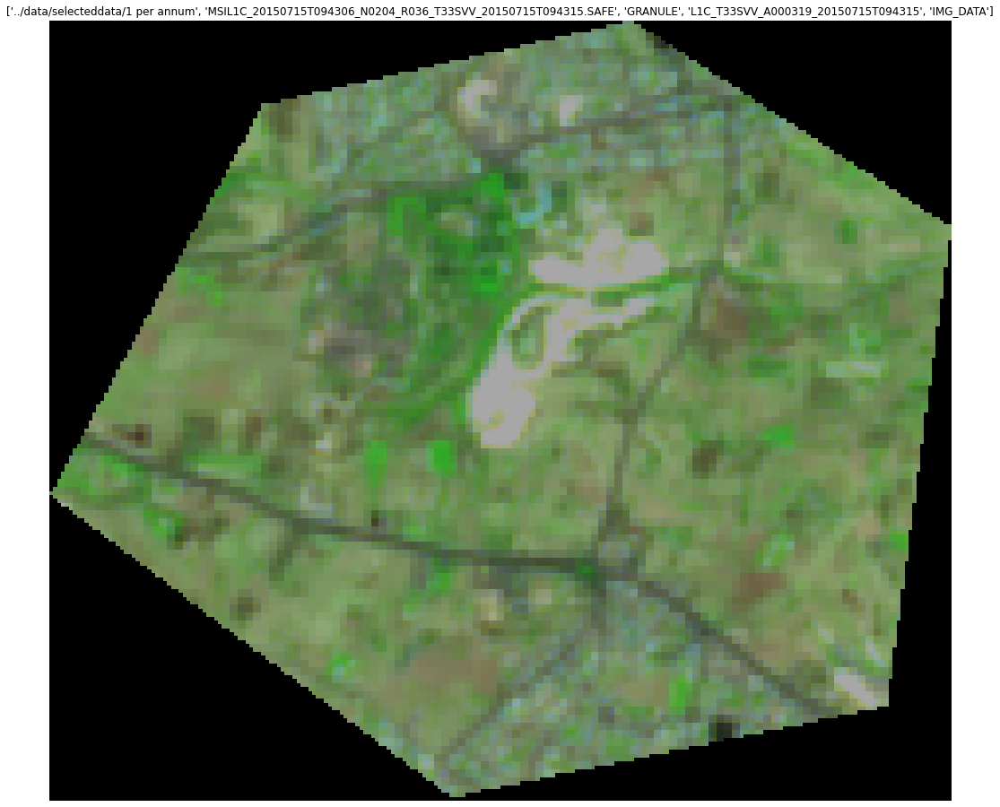

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20160801T095032_N0204_R079_T33SVV_20160801T095532.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20160801T133428_S20160801T095532
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A005796_20160801T095532
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20160801T095032_B01.jp2
--------------- T33SVV_20160801T095032_B02.jp2
--------------- T33SVV_20160801T095032_B03.jp2
--------------- T33SVV_20160801T095032_B04.jp2
--------------- T33SVV_20160801T095032_B05.jp2
--------------- T33SVV_20160801T095032_B06.jp2
--------------- T33SVV_20160801T095032_B07.jp2
--------------- T33SVV_20160801T095032_B08.jp2
--------------- T33SVV_20160801T095032_B09.jp2
--------------- T33SVV_20160801T095032_B10.jp2
--------------- T33SVV_20160801T095032_B11.jp2
--------------- T33SVV_20160801T095032_B12.jp2
--------------- T33SVV_20160801T095032_B8A.jp2
--------------- T33SVV_20160801T095032_TCI.jp2
1
10980
10980
uint

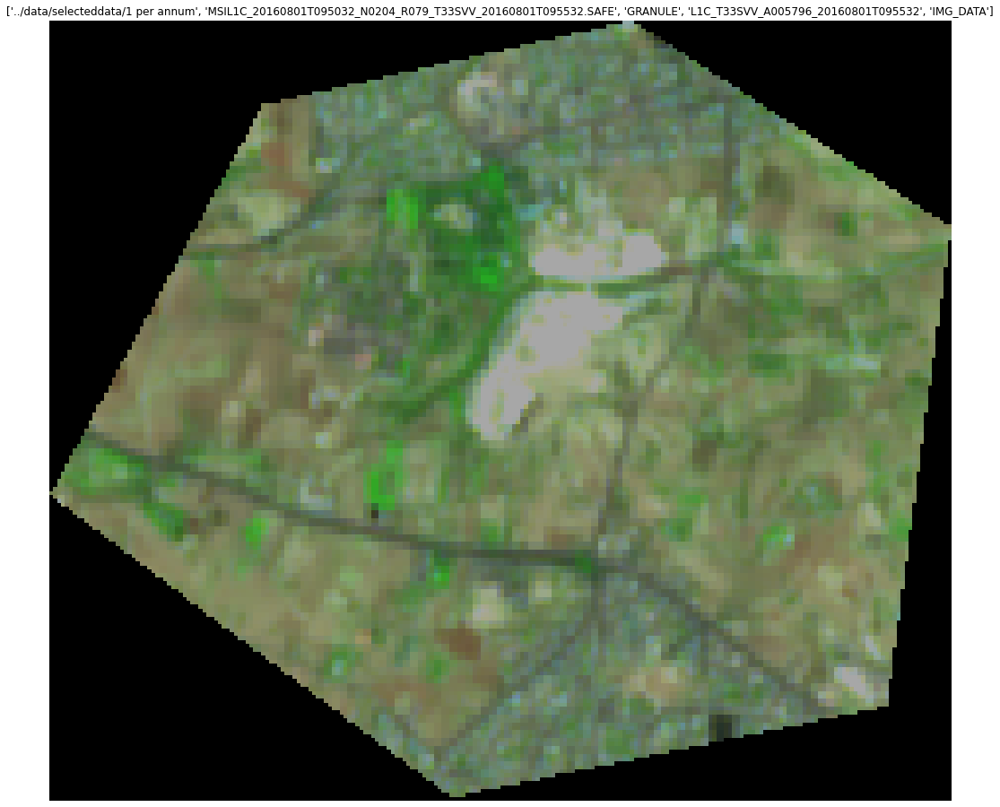

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20170826T095031_N0205_R079_T33SVV_20200815T095735.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20170826T133802_S20170826T095913
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A011373_20170826T095913
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20170826T095031_B01.jp2
--------------- T33SVV_20170826T095031_B02.jp2
--------------- T33SVV_20170826T095031_B03.jp2
--------------- T33SVV_20170826T095031_B04.jp2
--------------- T33SVV_20170826T095031_B05.jp2
--------------- T33SVV_20170826T095031_B06.jp2
--------------- T33SVV_20170826T095031_B07.jp2
--------------- T33SVV_20170826T095031_B08.jp2
--------------- T33SVV_20170826T095031_B09.jp2
--------------- T33SVV_20170826T095031_B10.jp2
--------------- T33SVV_20170826T095031_B11.jp2
--------------- T33SVV_20170826T095031_B12.jp2
--------------- T33SVV_20170826T095031_B8A.jp2
--------------- T33SVV_20170826T095031_TCI.jp2
1
10980
10980
uint

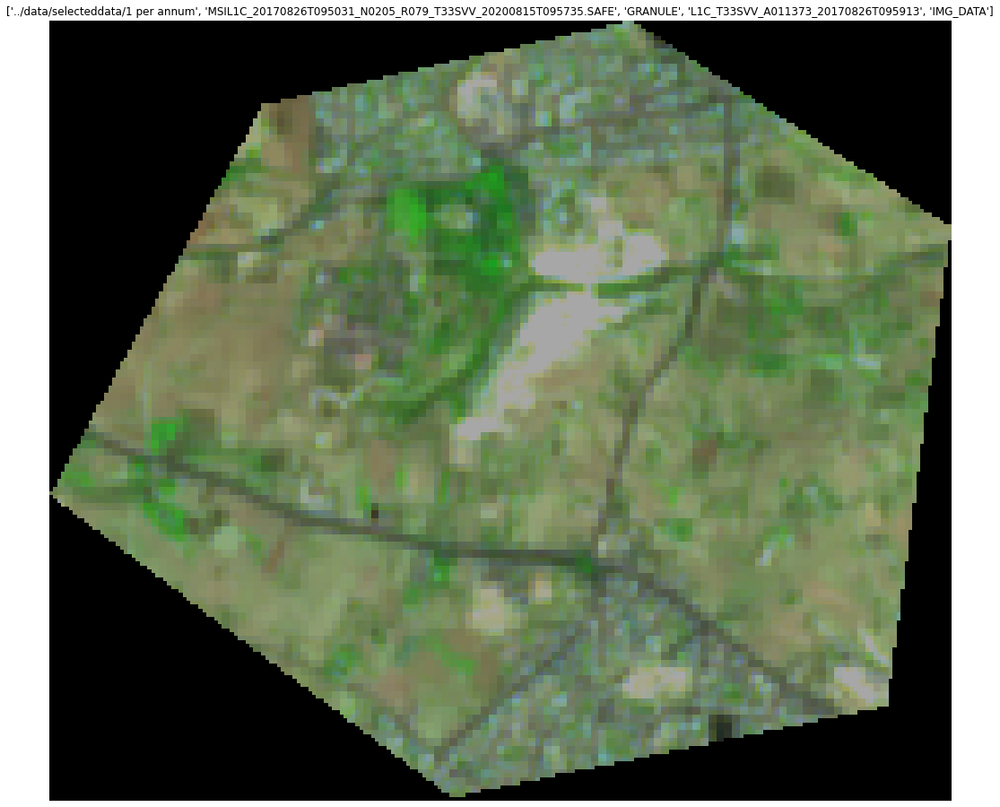

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20180727T095029_N0206_R079_T33SVV_20180727T135801.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_SGS__20180727T135801_S20180727T095811
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007255_20180727T095811
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180727T095029_B01.jp2
--------------- T33SVV_20180727T095029_B02.jp2
--------------- T33SVV_20180727T095029_B03.jp2
--------------- T33SVV_20180727T095029_B04.jp2
--------------- T33SVV_20180727T095029_B05.jp2
--------------- T33SVV_20180727T095029_B06.jp2
--------------- T33SVV_20180727T095029_B07.jp2
--------------- T33SVV_20180727T095029_B08.jp2
--------------- T33SVV_20180727T095029_B09.jp2
--------------- T33SVV_20180727T095029_B10.jp2
--------------- T33SVV_20180727T095029_B11.jp2
--------------- T33SVV_20180727T095029_B12.jp2
--------------- T33SVV_20180727T095029_B8A.jp2
--------------- T33SVV_20180727T095029_TCI.jp2
1
10980
10980
uint

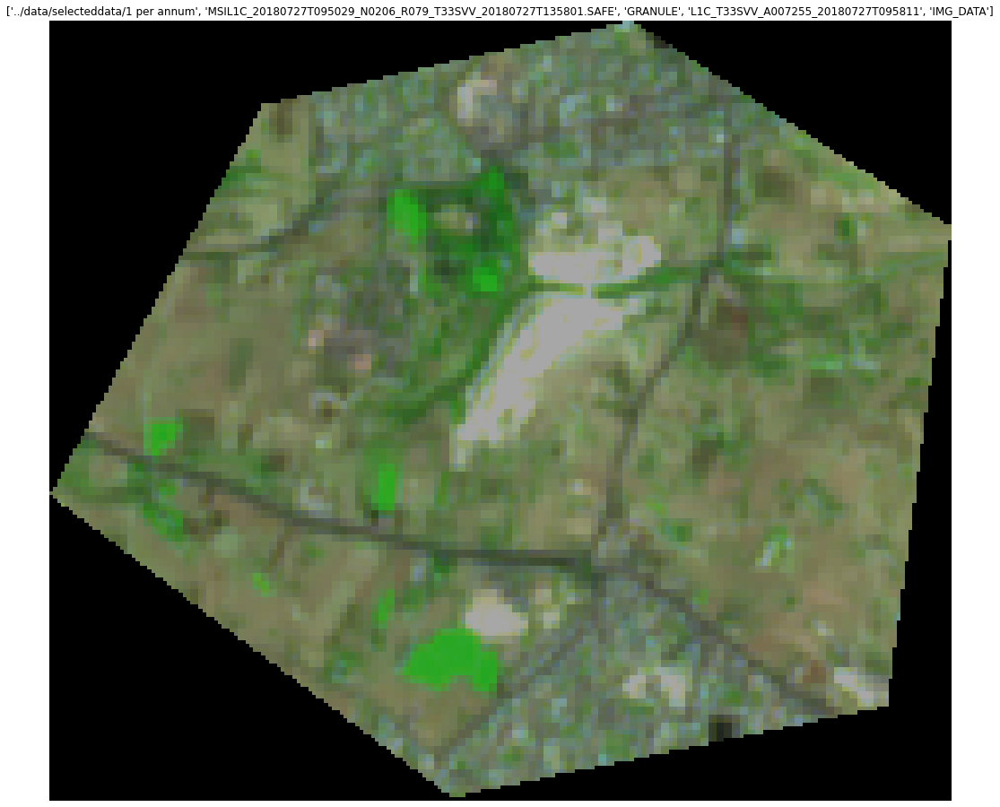

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20200731T095041_N0209_R079_T33SVV_20200731T102505.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20200731T102505_S20200731T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A026674_20200731T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20200731T095041_B01.jp2
--------------- T33SVV_20200731T095041_B02.jp2
--------------- T33SVV_20200731T095041_B03.jp2
--------------- T33SVV_20200731T095041_B04.jp2
--------------- T33SVV_20200731T095041_B05.jp2
--------------- T33SVV_20200731T095041_B06.jp2
--------------- T33SVV_20200731T095041_B07.jp2
--------------- T33SVV_20200731T095041_B08.jp2
--------------- T33SVV_20200731T095041_B09.jp2
--------------- T33SVV_20200731T095041_B10.jp2
--------------- T33SVV_20200731T095041_B11.jp2
--------------- T33SVV_20200731T095041_B12.jp2
--------------- T33SVV_20200731T095041_B8A.jp2
--------------- T33SVV_20200731T095041_TCI.jp2
1
10980
10980
uint

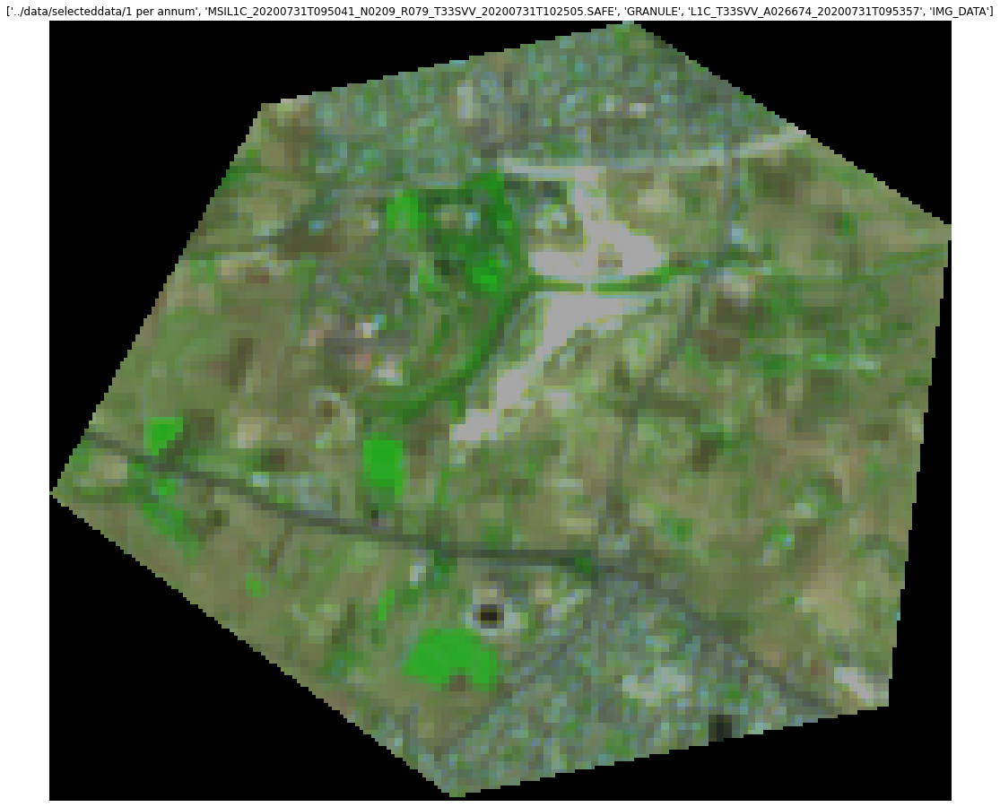

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20190811T095039_N0208_R079_T33SVV_20190811T122017.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20190811T122017_S20190811T095702
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A012689_20190811T095702
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20190811T095039_B01.jp2
--------------- T33SVV_20190811T095039_B02.jp2
--------------- T33SVV_20190811T095039_B03.jp2
--------------- T33SVV_20190811T095039_B04.jp2
--------------- T33SVV_20190811T095039_B05.jp2
--------------- T33SVV_20190811T095039_B06.jp2
--------------- T33SVV_20190811T095039_B07.jp2
--------------- T33SVV_20190811T095039_B08.jp2
--------------- T33SVV_20190811T095039_B09.jp2
--------------- T33SVV_20190811T095039_B10.jp2
--------------- T33SVV_20190811T095039_B11.jp2
--------------- T33SVV_20190811T095039_B12.jp2
--------------- T33SVV_20190811T095039_B8A.jp2
--------------- T33SVV_20190811T095039_TCI.jp2
1
10980
10980


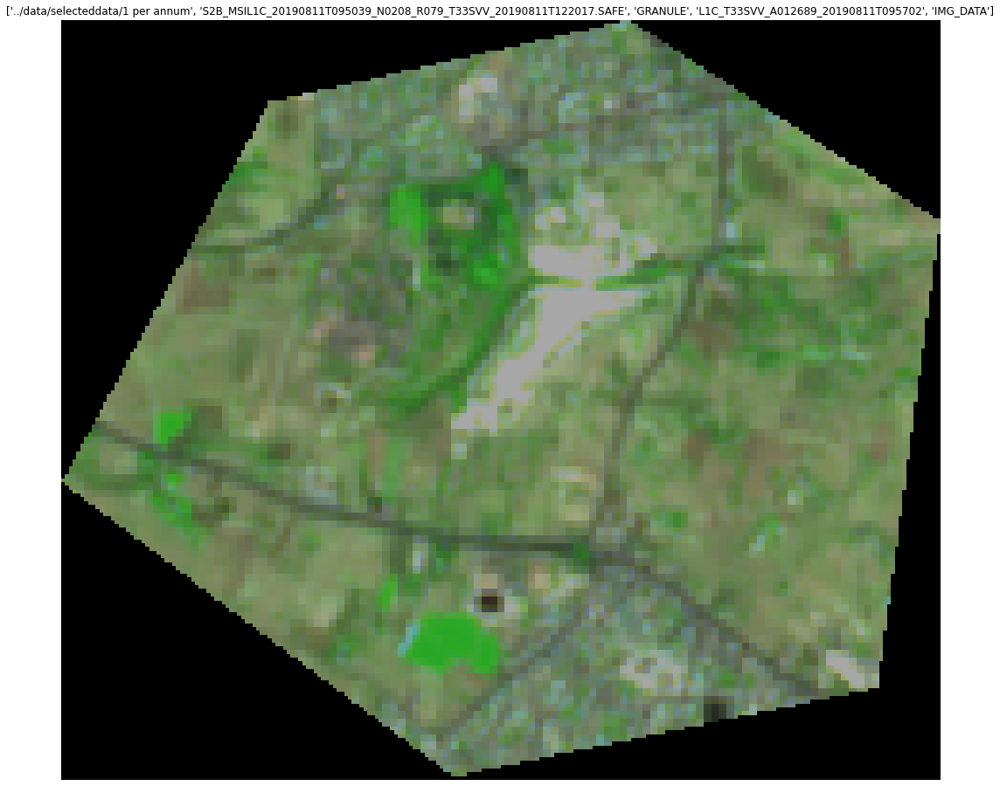

------------ QI_DATA
------ HTML
------ rep_info


In [10]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B04' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #blue
            #if 'B04_20m' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #blue

            if 'B8A' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #green
            #if 'B8A_20m' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #green

            if 'B12' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #red
            #if 'B12_20m' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #red

            #if 'B08' in file: band8 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG') #nir

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            SwirColour = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            SwirColour.write(band2.read(1),1) #blue
            SwirColour.write(band3.read(1),2) #green
            SwirColour.write(band4.read(1),3) #red
            SwirColour.close()

            nReserve_proj = region.to_crs({'init': 'epsg:32633'})

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'SWIR_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# FalseColour Urban (12,11,4)
---

 1 per annum
--- MSIL1C_20150715T094306_N0204_R036_T33SVV_20150715T094315.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160812T015357_S20150715T094315
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A000319_20150715T094315
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20150715T094306_B01.jp2
--------------- T33SVV_20150715T094306_B02.jp2
--------------- T33SVV_20150715T094306_B03.jp2
--------------- T33SVV_20150715T094306_B04.jp2
--------------- T33SVV_20150715T094306_B05.jp2
--------------- T33SVV_20150715T094306_B06.jp2
--------------- T33SVV_20150715T094306_B07.jp2
--------------- T33SVV_20150715T094306_B08.jp2
--------------- T33SVV_20150715T094306_B09.jp2
--------------- T33SVV_20150715T094306_B10.jp2
--------------- T33SVV_20150715T094306_B11.jp2
--------------- T33SVV_20150715T094306_B12.jp2
--------------- T33SVV_20150715T094306_B8A.jp2
--------------- T33SVV_20150715T094306_TCI.jp2
1
10980
10980
uint16
EPSG:32633
| 10.00, 0.00, 399960.

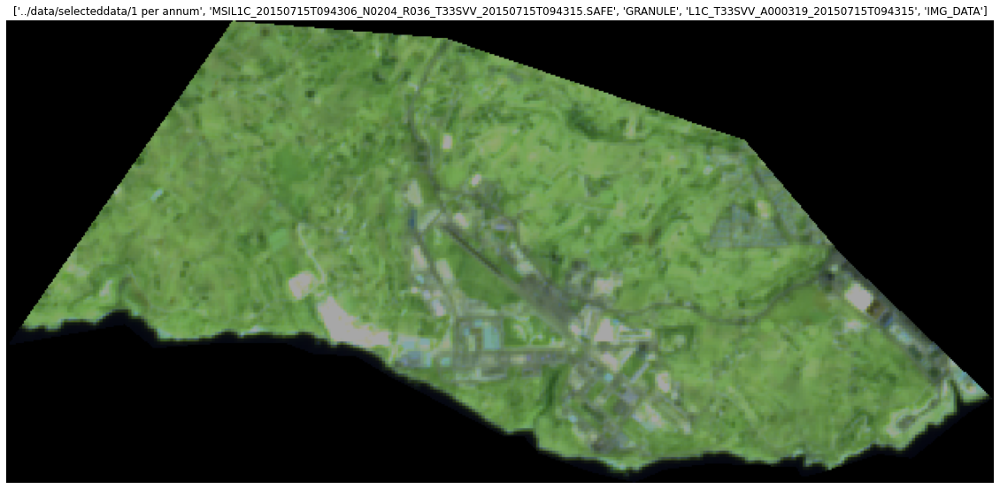

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20160801T095032_N0204_R079_T33SVV_20160801T095532.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20160801T133428_S20160801T095532
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A005796_20160801T095532
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20160801T095032_B01.jp2
--------------- T33SVV_20160801T095032_B02.jp2
--------------- T33SVV_20160801T095032_B03.jp2
--------------- T33SVV_20160801T095032_B04.jp2
--------------- T33SVV_20160801T095032_B05.jp2
--------------- T33SVV_20160801T095032_B06.jp2
--------------- T33SVV_20160801T095032_B07.jp2
--------------- T33SVV_20160801T095032_B08.jp2
--------------- T33SVV_20160801T095032_B09.jp2
--------------- T33SVV_20160801T095032_B10.jp2
--------------- T33SVV_20160801T095032_B11.jp2
--------------- T33SVV_20160801T095032_B12.jp2
--------------- T33SVV_20160801T095032_B8A.jp2
--------------- T33SVV_20160801T095032_TCI.jp2
1
10980
10980
uint

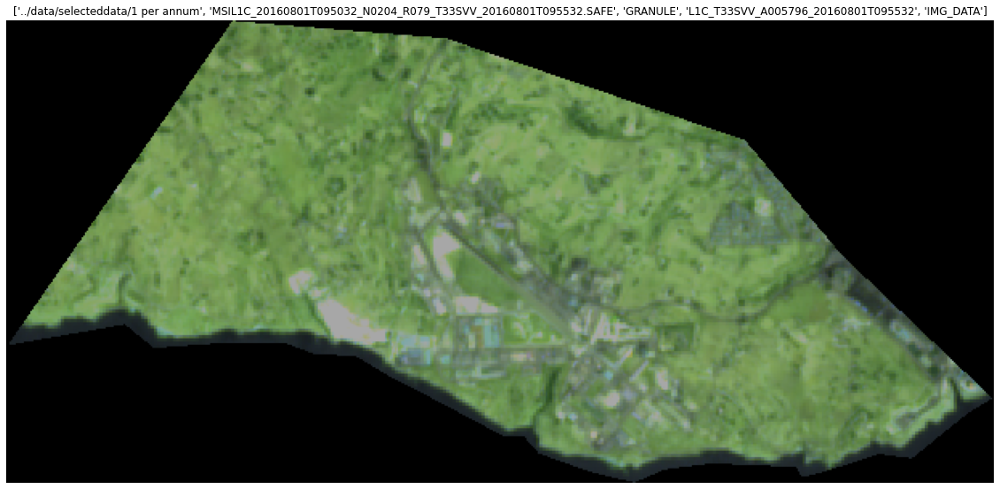

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20170826T095031_N0205_R079_T33SVV_20200815T095735.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20170826T133802_S20170826T095913
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A011373_20170826T095913
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20170826T095031_B01.jp2
--------------- T33SVV_20170826T095031_B02.jp2
--------------- T33SVV_20170826T095031_B03.jp2
--------------- T33SVV_20170826T095031_B04.jp2
--------------- T33SVV_20170826T095031_B05.jp2
--------------- T33SVV_20170826T095031_B06.jp2
--------------- T33SVV_20170826T095031_B07.jp2
--------------- T33SVV_20170826T095031_B08.jp2
--------------- T33SVV_20170826T095031_B09.jp2
--------------- T33SVV_20170826T095031_B10.jp2
--------------- T33SVV_20170826T095031_B11.jp2
--------------- T33SVV_20170826T095031_B12.jp2
--------------- T33SVV_20170826T095031_B8A.jp2
--------------- T33SVV_20170826T095031_TCI.jp2
1
10980
10980
uint

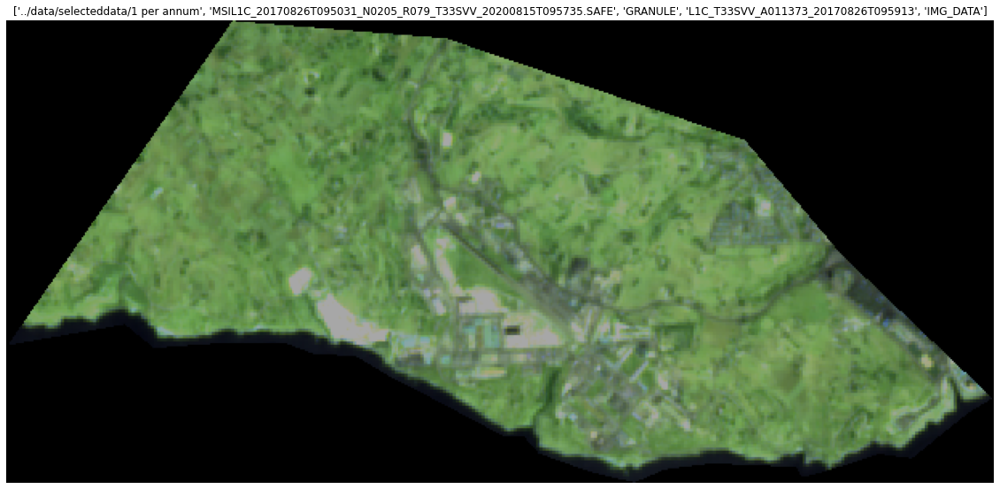

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20180727T095029_N0206_R079_T33SVV_20180727T135801.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_SGS__20180727T135801_S20180727T095811
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007255_20180727T095811
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180727T095029_B01.jp2
--------------- T33SVV_20180727T095029_B02.jp2
--------------- T33SVV_20180727T095029_B03.jp2
--------------- T33SVV_20180727T095029_B04.jp2
--------------- T33SVV_20180727T095029_B05.jp2
--------------- T33SVV_20180727T095029_B06.jp2
--------------- T33SVV_20180727T095029_B07.jp2
--------------- T33SVV_20180727T095029_B08.jp2
--------------- T33SVV_20180727T095029_B09.jp2
--------------- T33SVV_20180727T095029_B10.jp2
--------------- T33SVV_20180727T095029_B11.jp2
--------------- T33SVV_20180727T095029_B12.jp2
--------------- T33SVV_20180727T095029_B8A.jp2
--------------- T33SVV_20180727T095029_TCI.jp2
1
10980
10980
uint

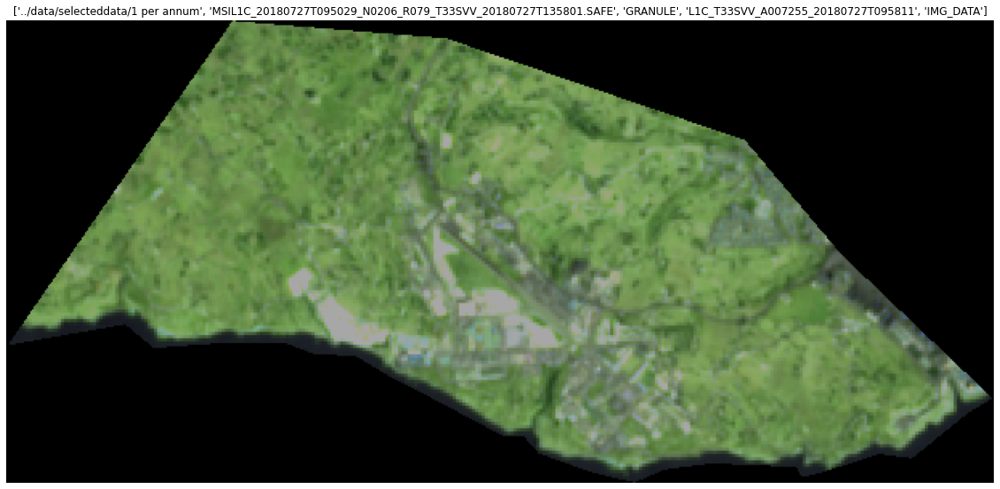

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20200731T095041_N0209_R079_T33SVV_20200731T102505.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20200731T102505_S20200731T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A026674_20200731T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20200731T095041_B01.jp2
--------------- T33SVV_20200731T095041_B02.jp2
--------------- T33SVV_20200731T095041_B03.jp2
--------------- T33SVV_20200731T095041_B04.jp2
--------------- T33SVV_20200731T095041_B05.jp2
--------------- T33SVV_20200731T095041_B06.jp2
--------------- T33SVV_20200731T095041_B07.jp2
--------------- T33SVV_20200731T095041_B08.jp2
--------------- T33SVV_20200731T095041_B09.jp2
--------------- T33SVV_20200731T095041_B10.jp2
--------------- T33SVV_20200731T095041_B11.jp2
--------------- T33SVV_20200731T095041_B12.jp2
--------------- T33SVV_20200731T095041_B8A.jp2
--------------- T33SVV_20200731T095041_TCI.jp2
1
10980
10980
uint

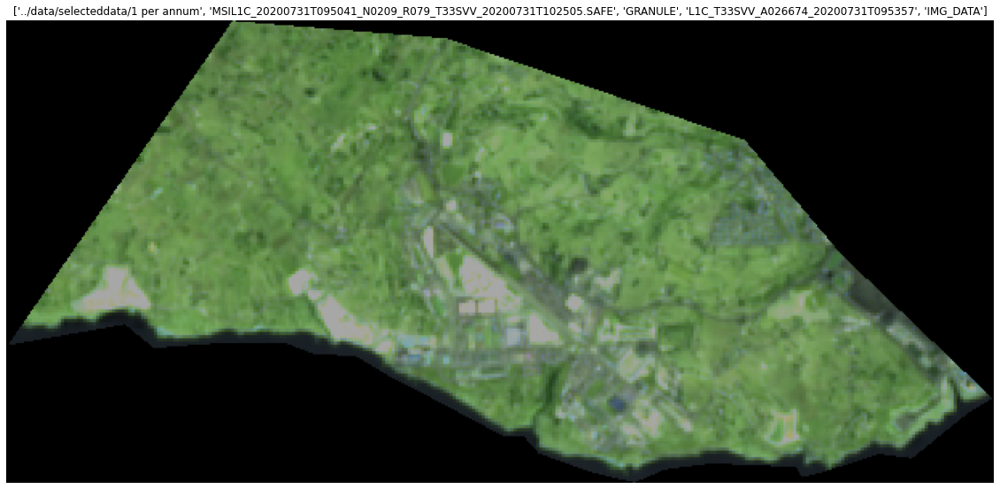

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20190811T095039_N0208_R079_T33SVV_20190811T122017.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20190811T122017_S20190811T095702
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A012689_20190811T095702
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20190811T095039_B01.jp2
--------------- T33SVV_20190811T095039_B02.jp2
--------------- T33SVV_20190811T095039_B03.jp2
--------------- T33SVV_20190811T095039_B04.jp2
--------------- T33SVV_20190811T095039_B05.jp2
--------------- T33SVV_20190811T095039_B06.jp2
--------------- T33SVV_20190811T095039_B07.jp2
--------------- T33SVV_20190811T095039_B08.jp2
--------------- T33SVV_20190811T095039_B09.jp2
--------------- T33SVV_20190811T095039_B10.jp2
--------------- T33SVV_20190811T095039_B11.jp2
--------------- T33SVV_20190811T095039_B12.jp2
--------------- T33SVV_20190811T095039_B8A.jp2
--------------- T33SVV_20190811T095039_TCI.jp2
1
10980
10980


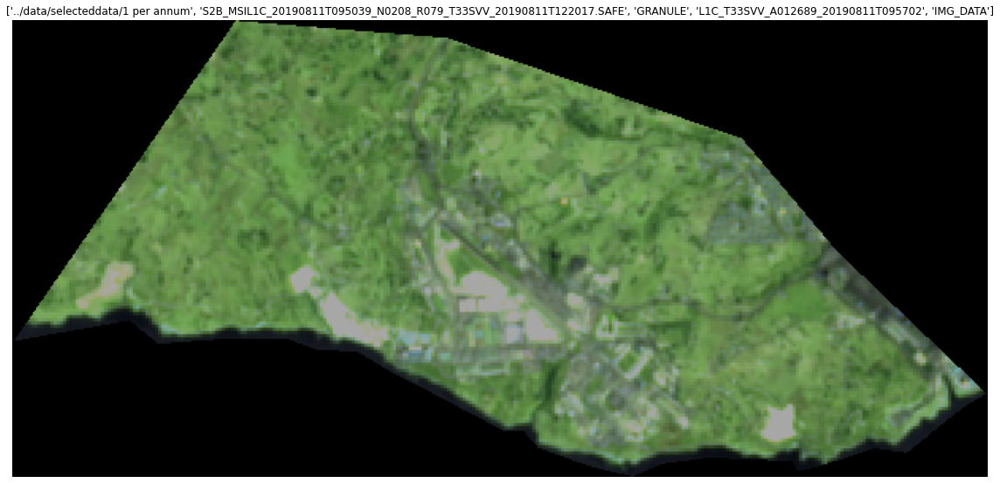

------------ QI_DATA
------ HTML
------ rep_info


In [4]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B04' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B11' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B12' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'Urban_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# Healthy Vegetation (8,11,2)
---

 1 per annum
--- MSIL1C_20150715T094306_N0204_R036_T33SVV_20150715T094315.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160812T015357_S20150715T094315
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A000319_20150715T094315
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20150715T094306_B01.jp2
--------------- T33SVV_20150715T094306_B02.jp2
--------------- T33SVV_20150715T094306_B03.jp2
--------------- T33SVV_20150715T094306_B04.jp2
--------------- T33SVV_20150715T094306_B05.jp2
--------------- T33SVV_20150715T094306_B06.jp2
--------------- T33SVV_20150715T094306_B07.jp2
--------------- T33SVV_20150715T094306_B08.jp2
--------------- T33SVV_20150715T094306_B09.jp2
--------------- T33SVV_20150715T094306_B10.jp2
--------------- T33SVV_20150715T094306_B11.jp2
--------------- T33SVV_20150715T094306_B12.jp2
--------------- T33SVV_20150715T094306_B8A.jp2
--------------- T33SVV_20150715T094306_TCI.jp2
1
10980
10980
uint16
EPSG:32633
| 10.00, 0.00, 399960.

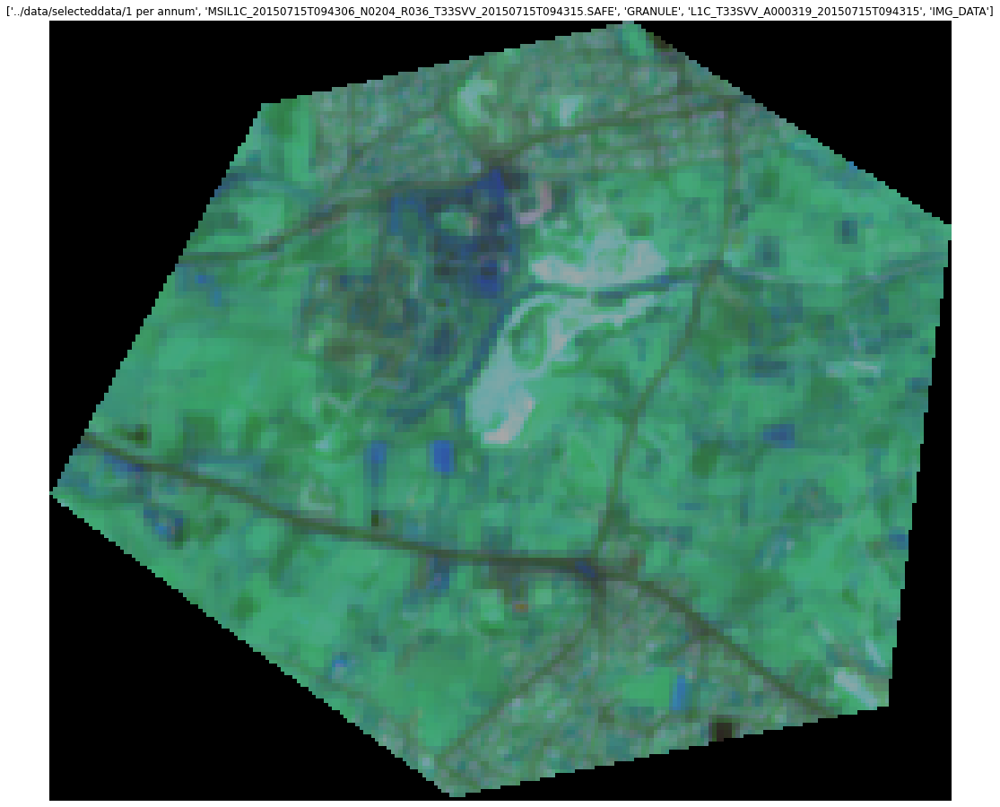

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20160801T095032_N0204_R079_T33SVV_20160801T095532.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20160801T133428_S20160801T095532
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A005796_20160801T095532
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20160801T095032_B01.jp2
--------------- T33SVV_20160801T095032_B02.jp2
--------------- T33SVV_20160801T095032_B03.jp2
--------------- T33SVV_20160801T095032_B04.jp2
--------------- T33SVV_20160801T095032_B05.jp2
--------------- T33SVV_20160801T095032_B06.jp2
--------------- T33SVV_20160801T095032_B07.jp2
--------------- T33SVV_20160801T095032_B08.jp2
--------------- T33SVV_20160801T095032_B09.jp2
--------------- T33SVV_20160801T095032_B10.jp2
--------------- T33SVV_20160801T095032_B11.jp2
--------------- T33SVV_20160801T095032_B12.jp2
--------------- T33SVV_20160801T095032_B8A.jp2
--------------- T33SVV_20160801T095032_TCI.jp2
1
10980
10980
uint

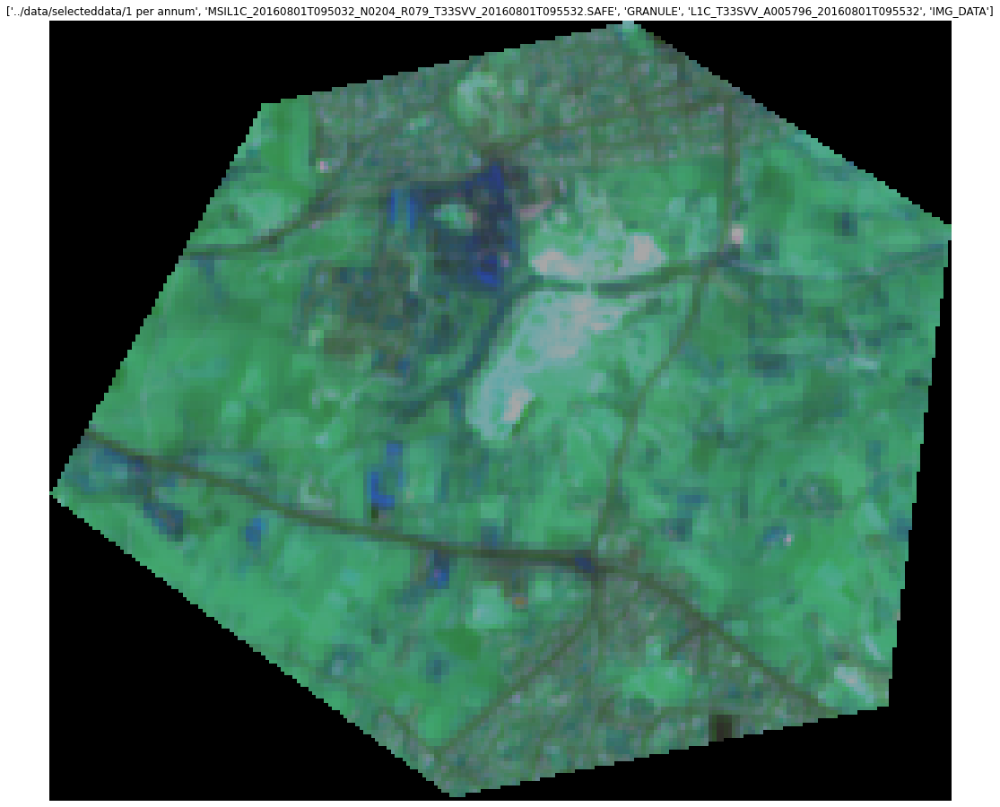

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20170826T095031_N0205_R079_T33SVV_20200815T095735.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MPS__20170826T133802_S20170826T095913
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A011373_20170826T095913
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20170826T095031_B01.jp2
--------------- T33SVV_20170826T095031_B02.jp2
--------------- T33SVV_20170826T095031_B03.jp2
--------------- T33SVV_20170826T095031_B04.jp2
--------------- T33SVV_20170826T095031_B05.jp2
--------------- T33SVV_20170826T095031_B06.jp2
--------------- T33SVV_20170826T095031_B07.jp2
--------------- T33SVV_20170826T095031_B08.jp2
--------------- T33SVV_20170826T095031_B09.jp2
--------------- T33SVV_20170826T095031_B10.jp2
--------------- T33SVV_20170826T095031_B11.jp2
--------------- T33SVV_20170826T095031_B12.jp2
--------------- T33SVV_20170826T095031_B8A.jp2
--------------- T33SVV_20170826T095031_TCI.jp2
1
10980
10980
uint

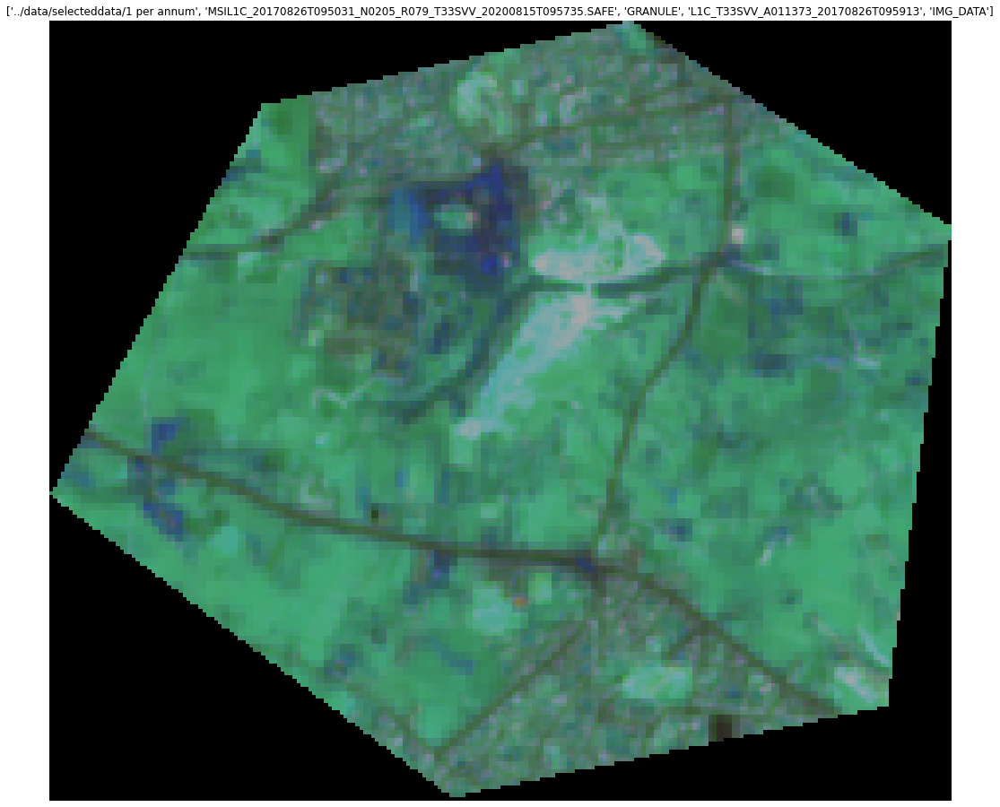

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20180727T095029_N0206_R079_T33SVV_20180727T135801.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_SGS__20180727T135801_S20180727T095811
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007255_20180727T095811
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180727T095029_B01.jp2
--------------- T33SVV_20180727T095029_B02.jp2
--------------- T33SVV_20180727T095029_B03.jp2
--------------- T33SVV_20180727T095029_B04.jp2
--------------- T33SVV_20180727T095029_B05.jp2
--------------- T33SVV_20180727T095029_B06.jp2
--------------- T33SVV_20180727T095029_B07.jp2
--------------- T33SVV_20180727T095029_B08.jp2
--------------- T33SVV_20180727T095029_B09.jp2
--------------- T33SVV_20180727T095029_B10.jp2
--------------- T33SVV_20180727T095029_B11.jp2
--------------- T33SVV_20180727T095029_B12.jp2
--------------- T33SVV_20180727T095029_B8A.jp2
--------------- T33SVV_20180727T095029_TCI.jp2
1
10980
10980
uint

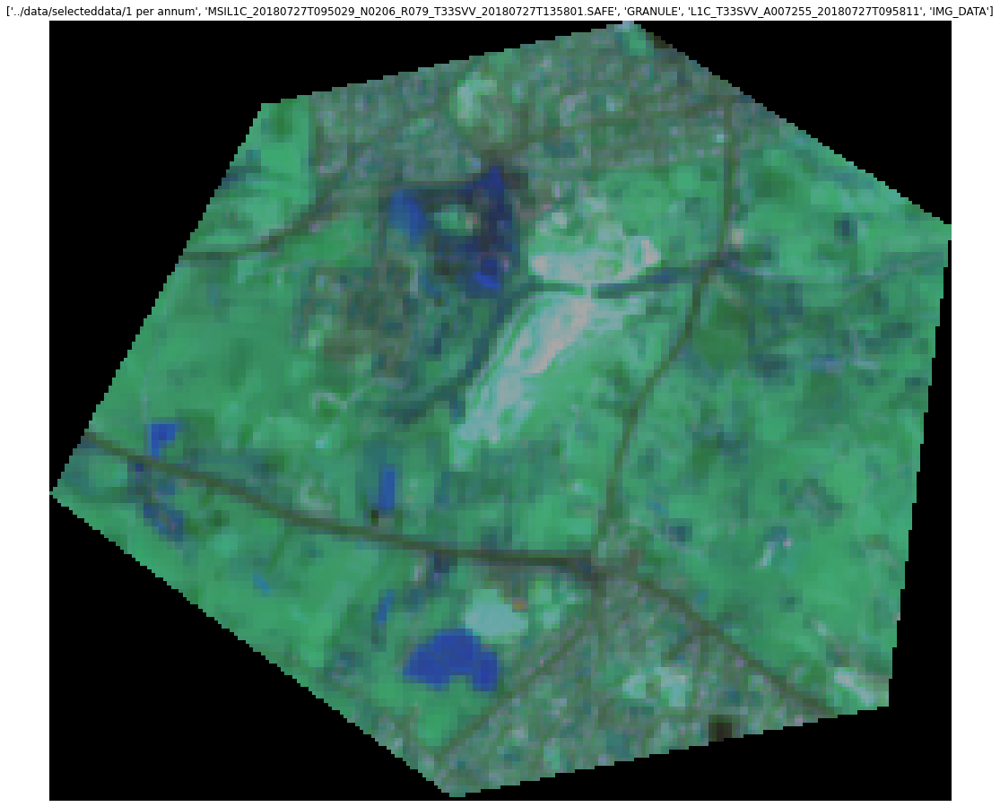

------------ QI_DATA
------ HTML
------ rep_info
--- MSIL1C_20200731T095041_N0209_R079_T33SVV_20200731T102505.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20200731T102505_S20200731T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A026674_20200731T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20200731T095041_B01.jp2
--------------- T33SVV_20200731T095041_B02.jp2
--------------- T33SVV_20200731T095041_B03.jp2
--------------- T33SVV_20200731T095041_B04.jp2
--------------- T33SVV_20200731T095041_B05.jp2
--------------- T33SVV_20200731T095041_B06.jp2
--------------- T33SVV_20200731T095041_B07.jp2
--------------- T33SVV_20200731T095041_B08.jp2
--------------- T33SVV_20200731T095041_B09.jp2
--------------- T33SVV_20200731T095041_B10.jp2
--------------- T33SVV_20200731T095041_B11.jp2
--------------- T33SVV_20200731T095041_B12.jp2
--------------- T33SVV_20200731T095041_B8A.jp2
--------------- T33SVV_20200731T095041_TCI.jp2
1
10980
10980
uint

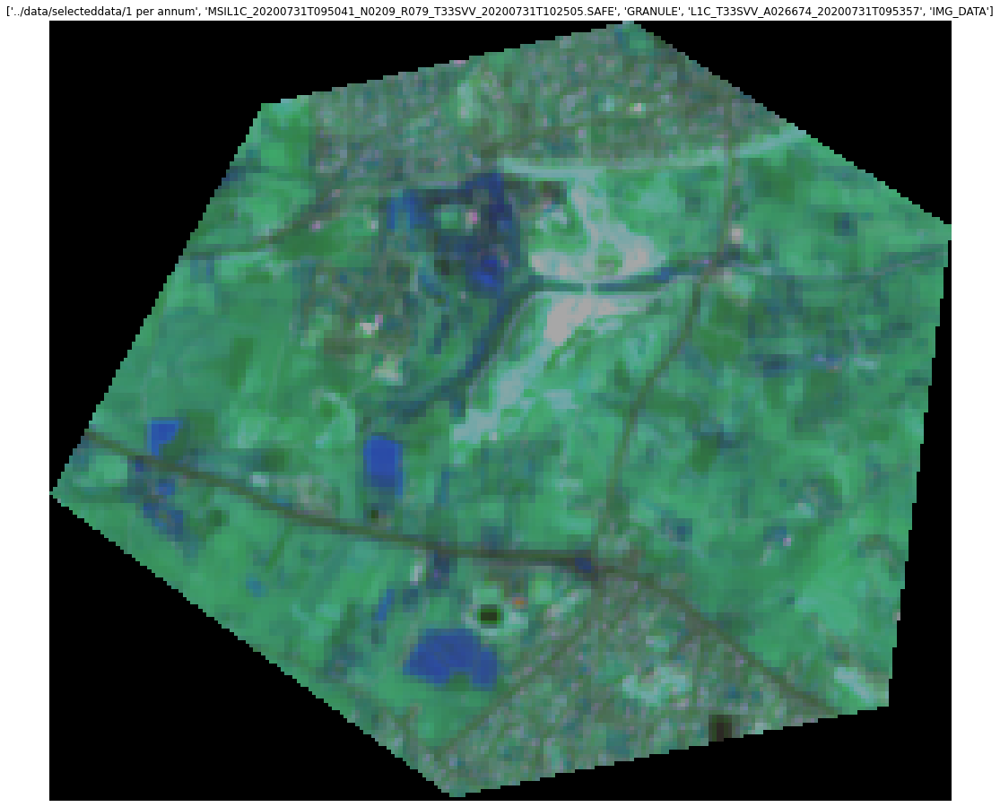

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20190811T095039_N0208_R079_T33SVV_20190811T122017.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20190811T122017_S20190811T095702
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A012689_20190811T095702
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20190811T095039_B01.jp2
--------------- T33SVV_20190811T095039_B02.jp2
--------------- T33SVV_20190811T095039_B03.jp2
--------------- T33SVV_20190811T095039_B04.jp2
--------------- T33SVV_20190811T095039_B05.jp2
--------------- T33SVV_20190811T095039_B06.jp2
--------------- T33SVV_20190811T095039_B07.jp2
--------------- T33SVV_20190811T095039_B08.jp2
--------------- T33SVV_20190811T095039_B09.jp2
--------------- T33SVV_20190811T095039_B10.jp2
--------------- T33SVV_20190811T095039_B11.jp2
--------------- T33SVV_20190811T095039_B12.jp2
--------------- T33SVV_20190811T095039_B8A.jp2
--------------- T33SVV_20190811T095039_TCI.jp2
1
10980
10980


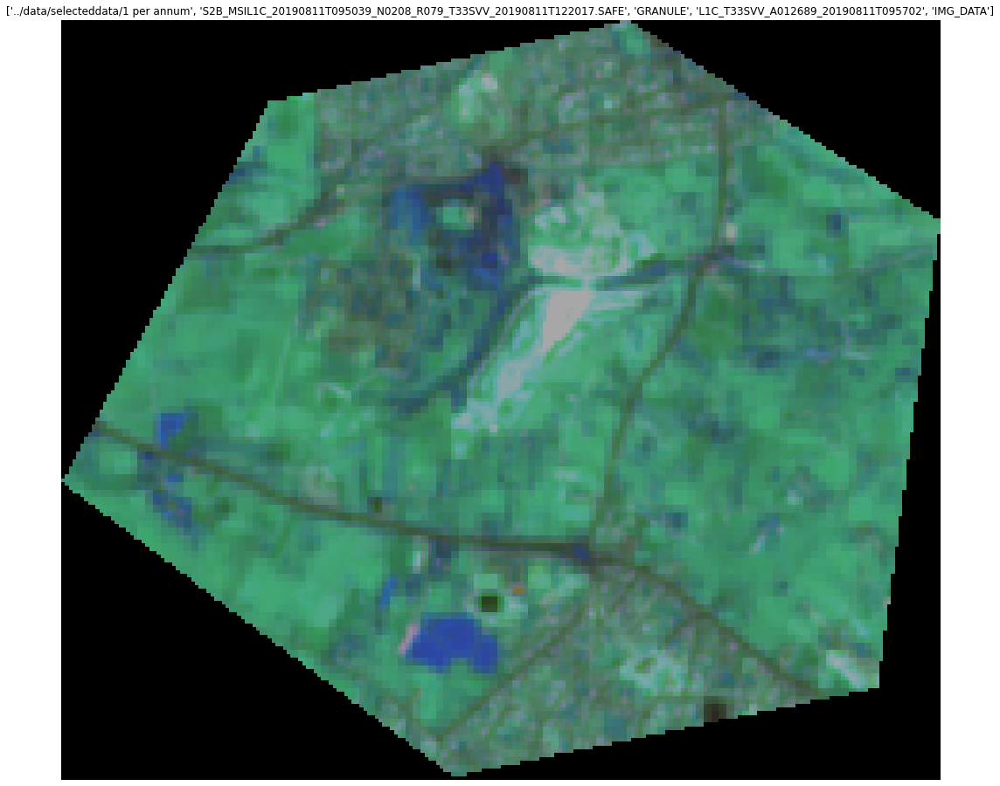

------------ QI_DATA
------ HTML
------ rep_info


In [7]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B08' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B11' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B02' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'VegHealth_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# Vegetation Analysis (11,8,4)
---

 gozo
--- S2A_MSIL1C_20151006T095016_N0204_R079_T33SVV_20151006T095014.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160714T132628_S20151006T095014
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A001506_20151006T095014
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20151006T095016_B01.jp2
--------------- T33SVV_20151006T095016_B02.jp2
--------------- T33SVV_20151006T095016_B03.jp2
--------------- T33SVV_20151006T095016_B04.jp2
--------------- T33SVV_20151006T095016_B05.jp2
--------------- T33SVV_20151006T095016_B06.jp2
--------------- T33SVV_20151006T095016_B07.jp2
--------------- T33SVV_20151006T095016_B08.jp2
--------------- T33SVV_20151006T095016_B09.jp2
--------------- T33SVV_20151006T095016_B10.jp2
--------------- T33SVV_20151006T095016_B11.jp2
--------------- T33SVV_20151006T095016_B12.jp2
--------------- T33SVV_20151006T095016_B8A.jp2
--------------- T33SVV_20151006T095016_TCI.jp2
1
5490
5490
uint16
EPSG:32633
| 20.00, 0.00, 399960.00|
|

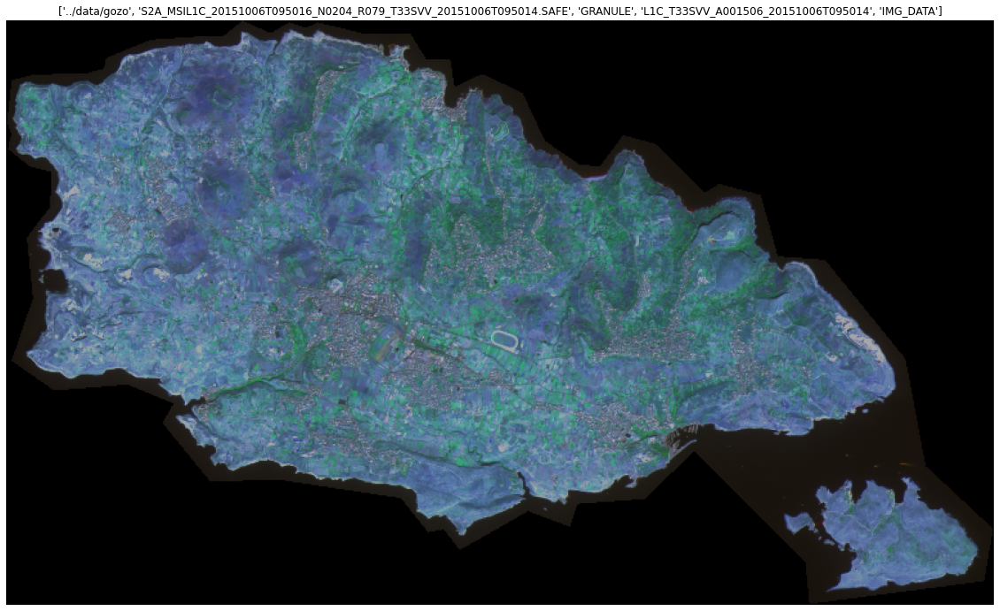

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20171224T095421_N0206_R079_T33SVV_20171224T122256.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20171224T122256_S20171224T095627
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A013089_20171224T095627
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20171224T095421_B01.jp2
--------------- T33SVV_20171224T095421_B02.jp2
--------------- T33SVV_20171224T095421_B03.jp2
--------------- T33SVV_20171224T095421_B04.jp2
--------------- T33SVV_20171224T095421_B05.jp2
--------------- T33SVV_20171224T095421_B06.jp2
--------------- T33SVV_20171224T095421_B07.jp2
--------------- T33SVV_20171224T095421_B08.jp2
--------------- T33SVV_20171224T095421_B09.jp2
--------------- T33SVV_20171224T095421_B10.jp2
--------------- T33SVV_20171224T095421_B11.jp2
--------------- T33SVV_20171224T095421_B12.jp2
--------------- T33SVV_20171224T095421_B8A.jp2
--------------- T33SVV_20171224T095421_TCI.jp2
1
5490
5490
ui

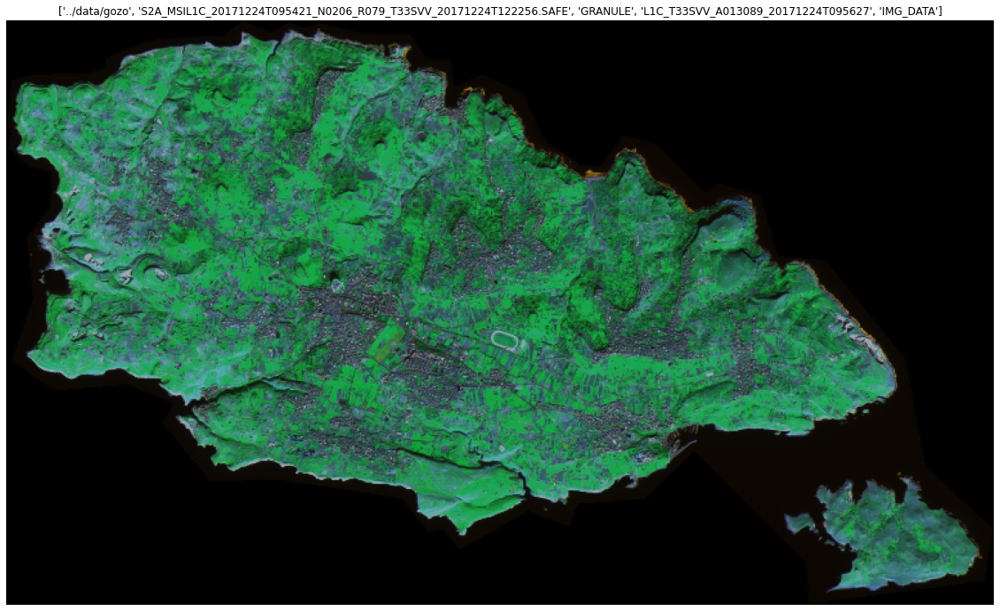

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20210206T095201_N0209_R079_T33SVV_20210206T110416.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPAE_20210206T110416_S20210206T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A029391_20210206T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20210206T095201_B01.jp2
--------------- T33SVV_20210206T095201_B02.jp2
--------------- T33SVV_20210206T095201_B03.jp2
--------------- T33SVV_20210206T095201_B04.jp2
--------------- T33SVV_20210206T095201_B05.jp2
--------------- T33SVV_20210206T095201_B06.jp2
--------------- T33SVV_20210206T095201_B07.jp2
--------------- T33SVV_20210206T095201_B08.jp2
--------------- T33SVV_20210206T095201_B09.jp2
--------------- T33SVV_20210206T095201_B10.jp2
--------------- T33SVV_20210206T095201_B11.jp2
--------------- T33SVV_20210206T095201_B12.jp2
--------------- T33SVV_20210206T095201_B8A.jp2
--------------- T33SVV_20210206T095201_TCI.jp2
1
5490
5490
ui

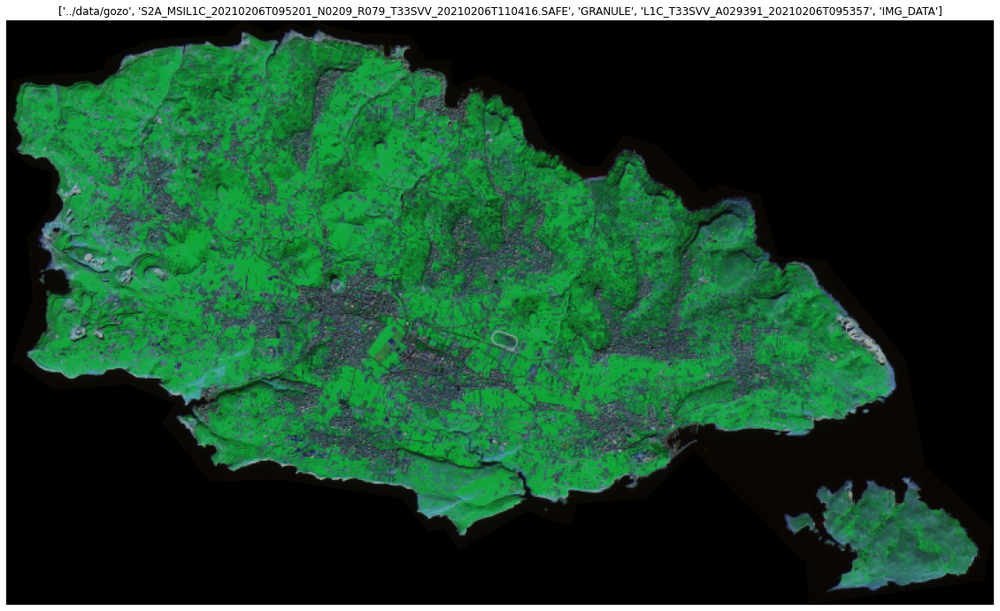

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20180905T095019_N0206_R079_T33SVV_20180920T103652.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20180920T103652_S20180905T095957
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007827_20180905T095957
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180905T095019_B01.jp2
--------------- T33SVV_20180905T095019_B02.jp2
--------------- T33SVV_20180905T095019_B03.jp2
--------------- T33SVV_20180905T095019_B04.jp2
--------------- T33SVV_20180905T095019_B05.jp2
--------------- T33SVV_20180905T095019_B06.jp2
--------------- T33SVV_20180905T095019_B07.jp2
--------------- T33SVV_20180905T095019_B08.jp2
--------------- T33SVV_20180905T095019_B09.jp2
--------------- T33SVV_20180905T095019_B10.jp2
--------------- T33SVV_20180905T095019_B11.jp2
--------------- T33SVV_20180905T095019_B12.jp2
--------------- T33SVV_20180905T095019_B8A.jp2
--------------- T33SVV_20180905T095019_TCI.jp2
1
5490
5490
ui

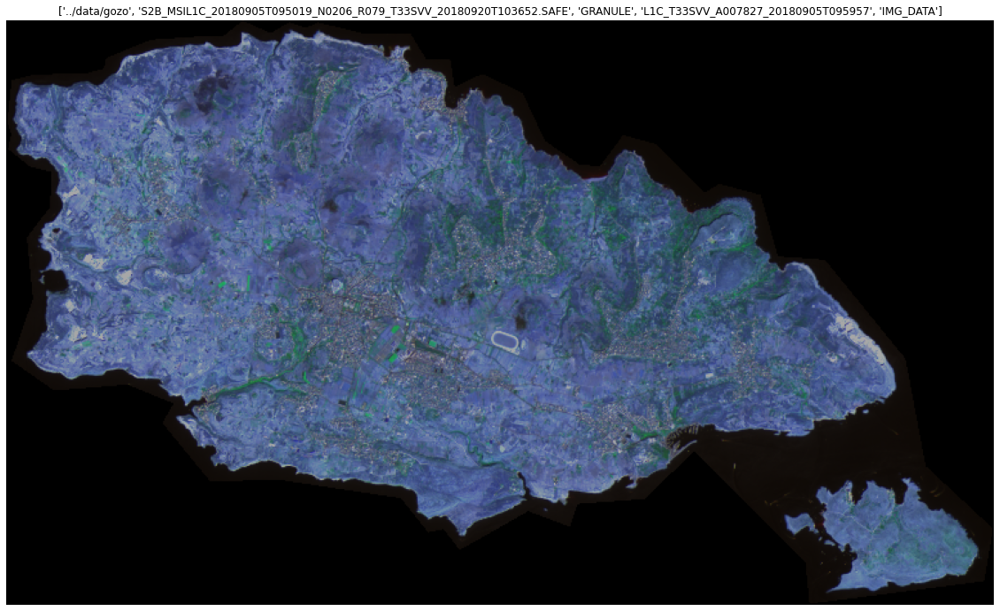

------------ QI_DATA
------ HTML
------ rep_info


In [7]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B11' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B08' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B04' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'VegAnal_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# Agriculture (11,8,2)
---

 gozo
--- S2A_MSIL1C_20151006T095016_N0204_R079_T33SVV_20151006T095014.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160714T132628_S20151006T095014
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A001506_20151006T095014
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20151006T095016_B01.jp2
--------------- T33SVV_20151006T095016_B02.jp2
--------------- T33SVV_20151006T095016_B03.jp2
--------------- T33SVV_20151006T095016_B04.jp2
--------------- T33SVV_20151006T095016_B05.jp2
--------------- T33SVV_20151006T095016_B06.jp2
--------------- T33SVV_20151006T095016_B07.jp2
--------------- T33SVV_20151006T095016_B08.jp2
--------------- T33SVV_20151006T095016_B09.jp2
--------------- T33SVV_20151006T095016_B10.jp2
--------------- T33SVV_20151006T095016_B11.jp2
--------------- T33SVV_20151006T095016_B12.jp2
--------------- T33SVV_20151006T095016_B8A.jp2
--------------- T33SVV_20151006T095016_TCI.jp2
1
5490
5490
uint16
EPSG:32633
| 20.00, 0.00, 399960.00|
|

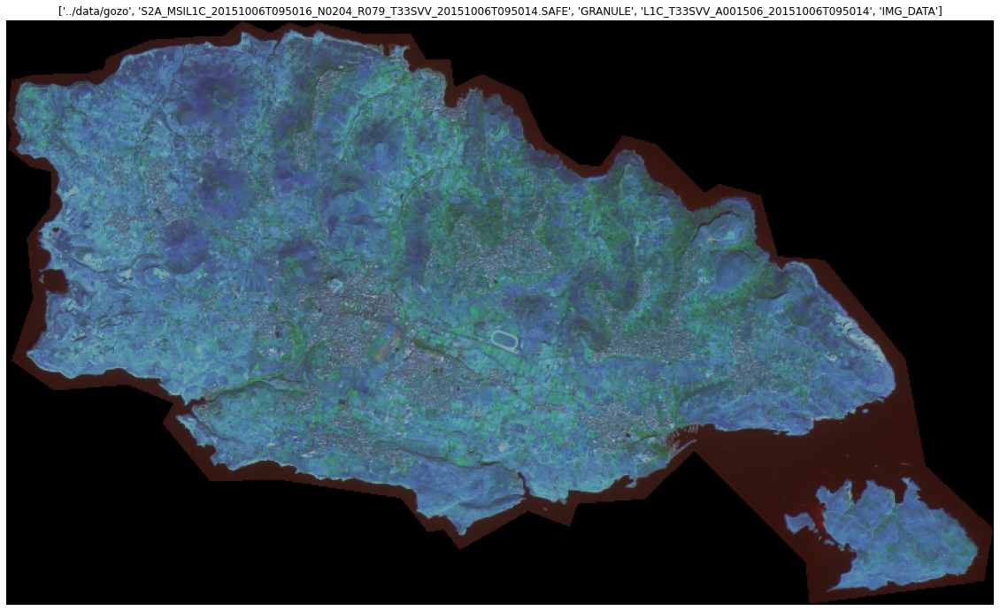

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20171224T095421_N0206_R079_T33SVV_20171224T122256.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20171224T122256_S20171224T095627
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A013089_20171224T095627
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20171224T095421_B01.jp2
--------------- T33SVV_20171224T095421_B02.jp2
--------------- T33SVV_20171224T095421_B03.jp2
--------------- T33SVV_20171224T095421_B04.jp2
--------------- T33SVV_20171224T095421_B05.jp2
--------------- T33SVV_20171224T095421_B06.jp2
--------------- T33SVV_20171224T095421_B07.jp2
--------------- T33SVV_20171224T095421_B08.jp2
--------------- T33SVV_20171224T095421_B09.jp2
--------------- T33SVV_20171224T095421_B10.jp2
--------------- T33SVV_20171224T095421_B11.jp2
--------------- T33SVV_20171224T095421_B12.jp2
--------------- T33SVV_20171224T095421_B8A.jp2
--------------- T33SVV_20171224T095421_TCI.jp2
1
5490
5490
ui

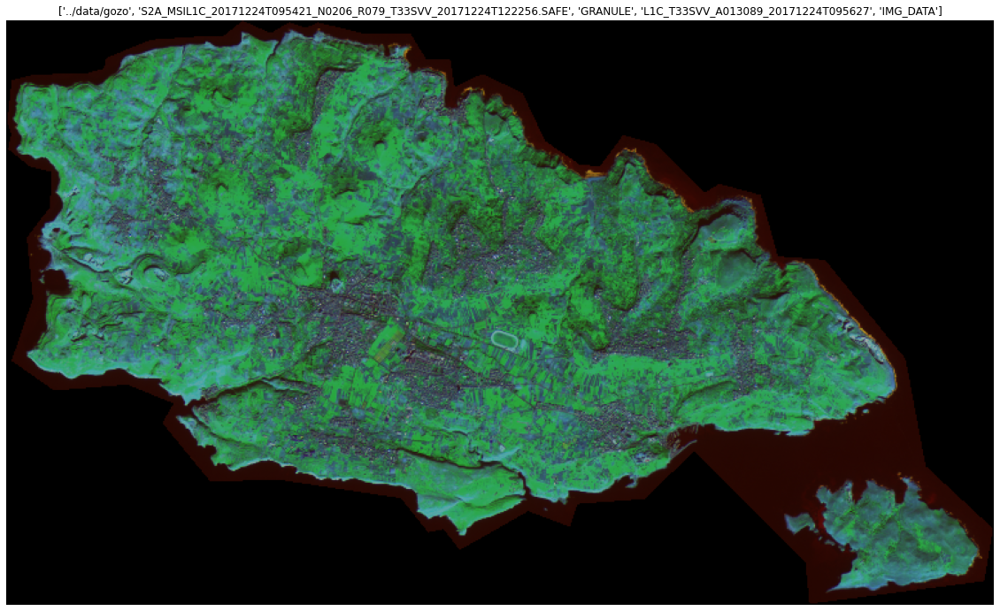

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20210206T095201_N0209_R079_T33SVV_20210206T110416.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPAE_20210206T110416_S20210206T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A029391_20210206T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20210206T095201_B01.jp2
--------------- T33SVV_20210206T095201_B02.jp2
--------------- T33SVV_20210206T095201_B03.jp2
--------------- T33SVV_20210206T095201_B04.jp2
--------------- T33SVV_20210206T095201_B05.jp2
--------------- T33SVV_20210206T095201_B06.jp2
--------------- T33SVV_20210206T095201_B07.jp2
--------------- T33SVV_20210206T095201_B08.jp2
--------------- T33SVV_20210206T095201_B09.jp2
--------------- T33SVV_20210206T095201_B10.jp2
--------------- T33SVV_20210206T095201_B11.jp2
--------------- T33SVV_20210206T095201_B12.jp2
--------------- T33SVV_20210206T095201_B8A.jp2
--------------- T33SVV_20210206T095201_TCI.jp2
1
5490
5490
ui

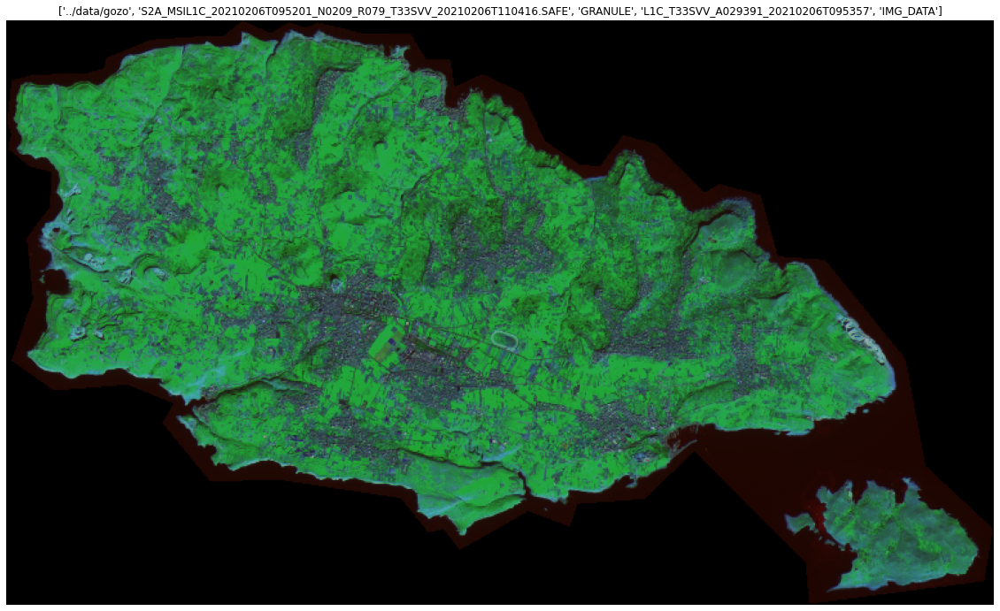

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20180905T095019_N0206_R079_T33SVV_20180920T103652.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20180920T103652_S20180905T095957
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007827_20180905T095957
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180905T095019_B01.jp2
--------------- T33SVV_20180905T095019_B02.jp2
--------------- T33SVV_20180905T095019_B03.jp2
--------------- T33SVV_20180905T095019_B04.jp2
--------------- T33SVV_20180905T095019_B05.jp2
--------------- T33SVV_20180905T095019_B06.jp2
--------------- T33SVV_20180905T095019_B07.jp2
--------------- T33SVV_20180905T095019_B08.jp2
--------------- T33SVV_20180905T095019_B09.jp2
--------------- T33SVV_20180905T095019_B10.jp2
--------------- T33SVV_20180905T095019_B11.jp2
--------------- T33SVV_20180905T095019_B12.jp2
--------------- T33SVV_20180905T095019_B8A.jp2
--------------- T33SVV_20180905T095019_TCI.jp2
1
5490
5490
ui

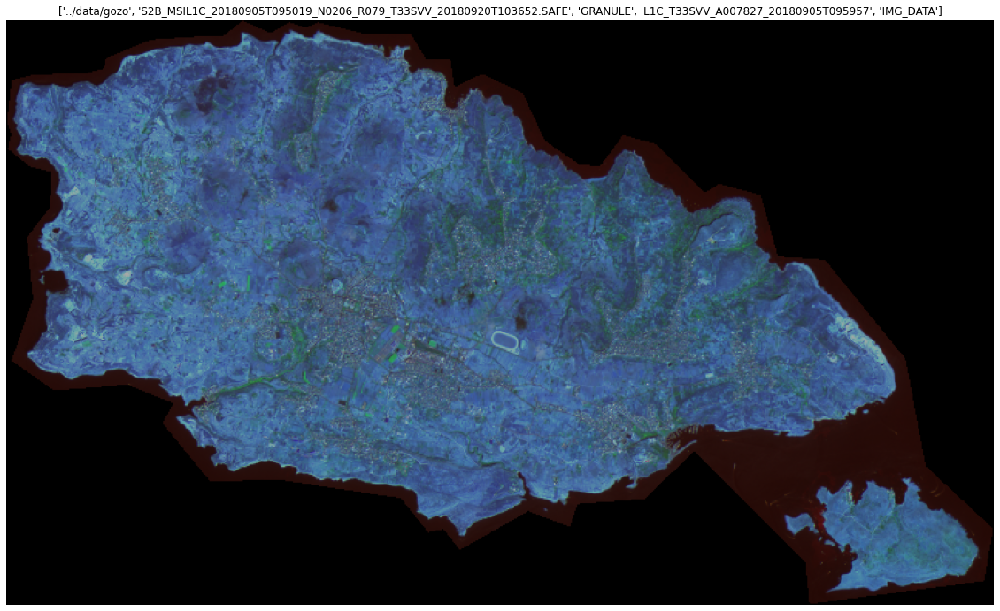

------------ QI_DATA
------ HTML
------ rep_info


In [8]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B11' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B08' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B02' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'Agriculture_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()

---
# Natural Colors with Atmospheric Removal (12,8,3)
---

 gozo
--- S2A_MSIL1C_20151006T095016_N0204_R079_T33SVV_20151006T095014.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20160714T132628_S20151006T095014
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A001506_20151006T095014
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20151006T095016_B01.jp2
--------------- T33SVV_20151006T095016_B02.jp2
--------------- T33SVV_20151006T095016_B03.jp2
--------------- T33SVV_20151006T095016_B04.jp2
--------------- T33SVV_20151006T095016_B05.jp2
--------------- T33SVV_20151006T095016_B06.jp2
--------------- T33SVV_20151006T095016_B07.jp2
--------------- T33SVV_20151006T095016_B08.jp2
--------------- T33SVV_20151006T095016_B09.jp2
--------------- T33SVV_20151006T095016_B10.jp2
--------------- T33SVV_20151006T095016_B11.jp2
--------------- T33SVV_20151006T095016_B12.jp2
--------------- T33SVV_20151006T095016_B8A.jp2
--------------- T33SVV_20151006T095016_TCI.jp2
1
5490
5490
uint16
EPSG:32633
| 20.00, 0.00, 399960.00|
|

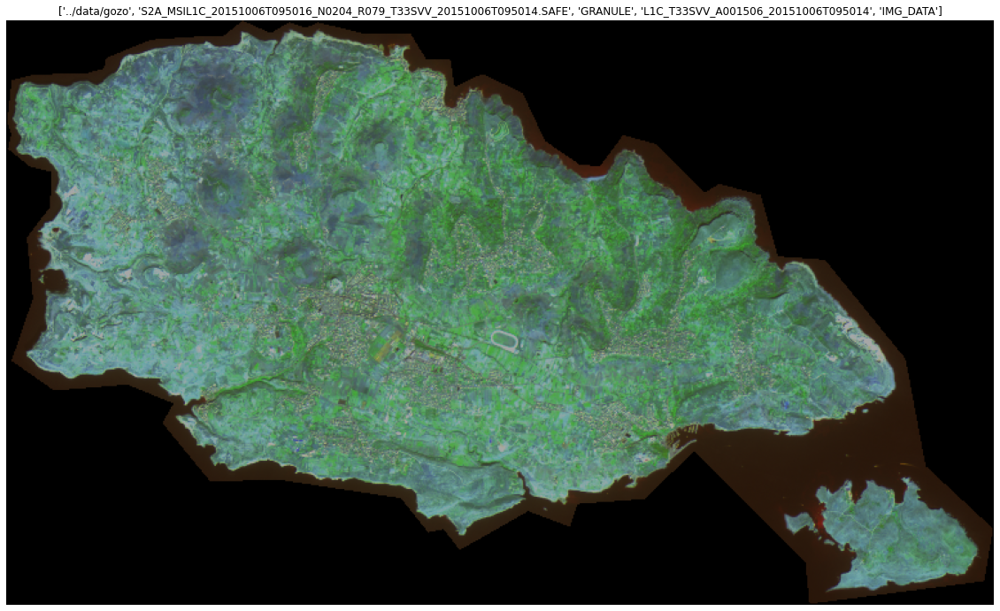

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20171224T095421_N0206_R079_T33SVV_20171224T122256.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_MTI__20171224T122256_S20171224T095627
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A013089_20171224T095627
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20171224T095421_B01.jp2
--------------- T33SVV_20171224T095421_B02.jp2
--------------- T33SVV_20171224T095421_B03.jp2
--------------- T33SVV_20171224T095421_B04.jp2
--------------- T33SVV_20171224T095421_B05.jp2
--------------- T33SVV_20171224T095421_B06.jp2
--------------- T33SVV_20171224T095421_B07.jp2
--------------- T33SVV_20171224T095421_B08.jp2
--------------- T33SVV_20171224T095421_B09.jp2
--------------- T33SVV_20171224T095421_B10.jp2
--------------- T33SVV_20171224T095421_B11.jp2
--------------- T33SVV_20171224T095421_B12.jp2
--------------- T33SVV_20171224T095421_B8A.jp2
--------------- T33SVV_20171224T095421_TCI.jp2
1
5490
5490
ui

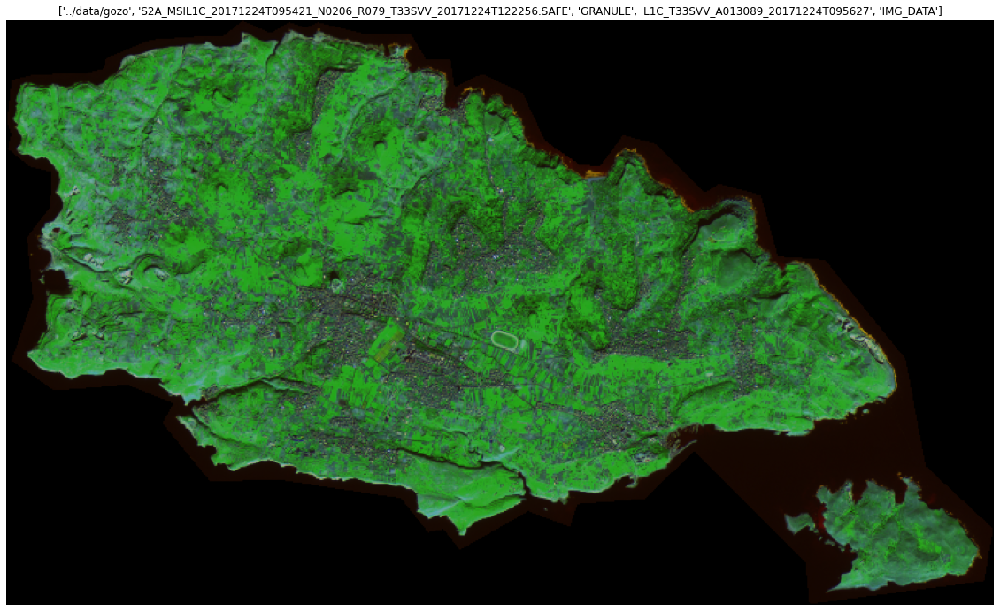

------------ QI_DATA
------ HTML
------ rep_info
--- S2A_MSIL1C_20210206T095201_N0209_R079_T33SVV_20210206T110416.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPAE_20210206T110416_S20210206T095357
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A029391_20210206T095357
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20210206T095201_B01.jp2
--------------- T33SVV_20210206T095201_B02.jp2
--------------- T33SVV_20210206T095201_B03.jp2
--------------- T33SVV_20210206T095201_B04.jp2
--------------- T33SVV_20210206T095201_B05.jp2
--------------- T33SVV_20210206T095201_B06.jp2
--------------- T33SVV_20210206T095201_B07.jp2
--------------- T33SVV_20210206T095201_B08.jp2
--------------- T33SVV_20210206T095201_B09.jp2
--------------- T33SVV_20210206T095201_B10.jp2
--------------- T33SVV_20210206T095201_B11.jp2
--------------- T33SVV_20210206T095201_B12.jp2
--------------- T33SVV_20210206T095201_B8A.jp2
--------------- T33SVV_20210206T095201_TCI.jp2
1
5490
5490
ui

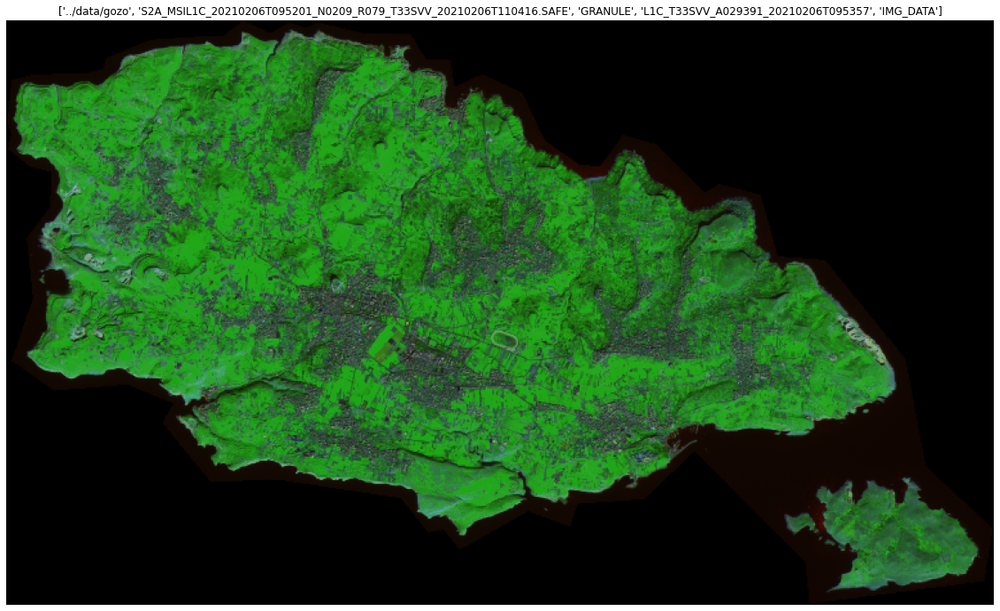

------------ QI_DATA
------ HTML
------ rep_info
--- S2B_MSIL1C_20180905T095019_N0206_R079_T33SVV_20180920T103652.SAFE
------ AUX_DATA
------ DATASTRIP
--------- DS_EPA__20180920T103652_S20180905T095957
------------ QI_DATA
------ GRANULE
--------- L1C_T33SVV_A007827_20180905T095957
------------ AUX_DATA
------------ IMG_DATA
--------------- T33SVV_20180905T095019_B01.jp2
--------------- T33SVV_20180905T095019_B02.jp2
--------------- T33SVV_20180905T095019_B03.jp2
--------------- T33SVV_20180905T095019_B04.jp2
--------------- T33SVV_20180905T095019_B05.jp2
--------------- T33SVV_20180905T095019_B06.jp2
--------------- T33SVV_20180905T095019_B07.jp2
--------------- T33SVV_20180905T095019_B08.jp2
--------------- T33SVV_20180905T095019_B09.jp2
--------------- T33SVV_20180905T095019_B10.jp2
--------------- T33SVV_20180905T095019_B11.jp2
--------------- T33SVV_20180905T095019_B12.jp2
--------------- T33SVV_20180905T095019_B8A.jp2
--------------- T33SVV_20180905T095019_TCI.jp2
1
5490
5490
ui

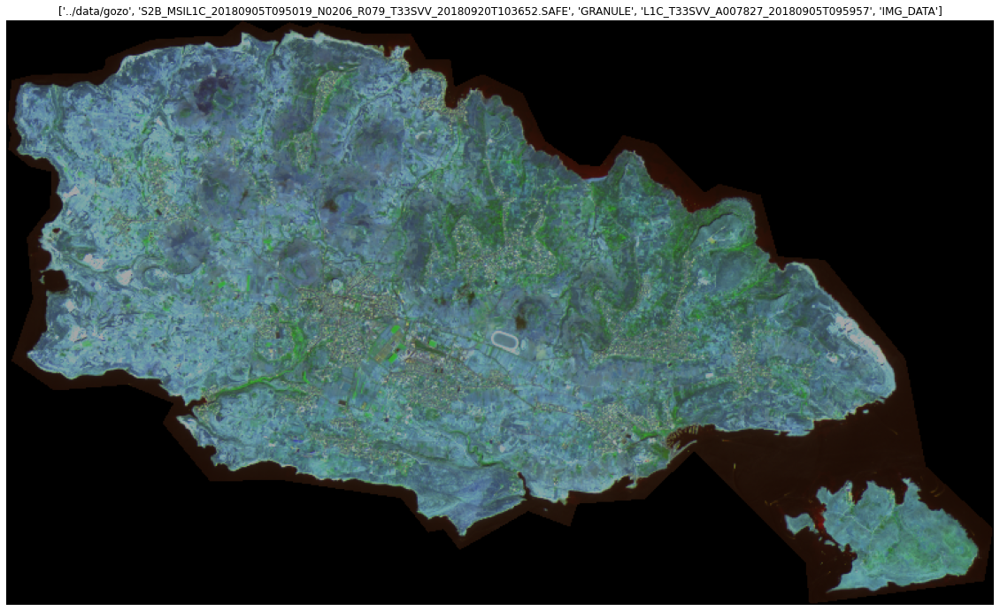

------------ QI_DATA
------ HTML
------ rep_info


In [9]:
path = Path(p)
k=0
# traverse root directory, and list directories as dirs and files as files
for root, dirs, files in os.walk(p):
    path = root.split(os.sep)
    print((len(path) - 1) * '---', os.path.basename(root))


    #print(path[:6])

    if os.path.basename(root) == 'IMG_DATA':
        k+=1
        for file in files:
            print(len(path) * '---', file)

            if 'B12' in file: band2 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B08' in file: band3 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

            if 'B03' in file: band4 = rasterio.open(os.path.join(root,file), driver='JP2OpenJPEG')

        if band2 is not None:
            #number of raster bands
            print(band2.count)
            #number of raster columns
            print(band2.width)
            #number of raster rows
            print(band2.height)

            #type of raster byte
            print(band2.dtypes[0])
            #raster sytem of reference
            print(band2.crs)
            #raster transform parameters
            print(band2.transform)

            #export true color image
            trueColor = rasterio.open('../Output/CACHE/SentinelTemp.tiff','w',driver='Gtiff',
                                     width=band2.width, height=band2.height,
                                     count=3,
                                     crs=band2.crs,
                                     transform=band2.transform,
                                     dtype=band2.dtypes[0]
                                     )
            trueColor.write(band2.read(1),1) #blue
            trueColor.write(band3.read(1),2) #green
            trueColor.write(band4.read(1),3) #red
            trueColor.close()

            with rio.open("../Output/CACHE/SentinelTemp.tiff") as src:
                out_image, out_transform = rio.mask.mask(src, nReserve_proj.geometry,crop=True)
                out_meta = src.meta.copy()
                out_meta.update({"driver": "GTiff",
                             "height": out_image.shape[1],
                             "width": out_image.shape[2],
                             "transform": out_transform,
                             "dtype": "uint16"})




            # Rescale the image (divide by 10000 to convert to [0:1] reflectance
            image = np.array(out_image[[2,1,0], :, :])
            p2, p98 = np.percentile(image, (2,98))
            image = exposure.rescale_intensity(image, in_range=(p2, p98)) / 100000

            rgb = np.array(image.transpose(1,2,0))

            #Plot and save image with Matplotlib
            fig = plt.figure(figsize=(20,16))
            ax=fig.add_subplot(1,1,1)
            ax.set_title(str(path))
            #fig.suptitle("BOLD TITLE")
            plt.axis('off')
            plt.imshow(rgb)

            #Save scaled reflectance image
            # Call 'savefig' to save this plot to an image file
            file_to_save = 'NCAR_Rendered_' + str(k).zfill(3) +'.png'
            plt.savefig(os.path.join('../Output/PROCESSED', file_to_save), bbox_inches='tight', transparent=True, pad_inches=0)
            plt.show()